## Variational Auto-Encoder (VAE) PyTorch implementation
Evolution of the auto-encoder neural network to reduce dimensionality of an airfoil defined by 30 coordinates.  
Papers:
- Larsen et al.: "Autoencoding beyond pixels using a learned similarity metric" - https://arxiv.org/abs/1512.09300
- Wang et al.: "Airfoil GAN: Encoding and Synthesizing Airfoils forAerodynamic-aware Shape Optimization" - https://arxiv.org/abs/2101.04757

### Imports

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pickle

import torch
from torch import nn
from torch.utils.data import DataLoader
from torch.nn import functional as F
from matplotlib import rc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from AirfoilVAE import AirfoilVAE
from compute_fid import compute_fid
from scipy.signal import savgol_filter


plt.style.use('seaborn-whitegrid')

In [5]:
# Library options
pd.options.mode.chained_assignment = None  # default='warn'
rc('font',**{'family':'sans-serif','sans-serif':['Helvetica']})
rc('font',**{'family':'serif','serif':['Palatino']})
rc('text', usetex=True)
plt.rcParams['font.size'] = 12

# Get CPU or GPU device for NN
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")
print(f"CUDA version: {torch.version.cuda}")

Using cuda device
CUDA version: 11.6


### Helper functions

In [11]:
# Helper functions
def smoothen(airfoil, window_length=15, polyorder=2):
    """
    Smooths the airfoil coordinates using a Savitzky-Golay filter.
    Inputs:
    - airfoil: numpy array with the airfoil coordinates
    """
    
    airfoil_smooth = savgol_filter(airfoil, window_length, polyorder)
    return airfoil_smooth

def airfoil_plot(airfoil_coords, linestyle=None, color=None, marker=None, fig=None, label=None, title=None, spacing='cosine', n_points=198):
    """
    Returns a plot of an airfoil. Used to visualize output of the optimizer. 
    Assumes 15 points for upper surface and 15 points for lower surface, with cosine spacing.
    NOTE: This function should be edited depending on the database.
    Inputs:
        - airfoil_coords: pandas DataFrame with airfoil coordinates and other parameters
    Outputs:
        - Plot of airfoil shape
    """
    if fig==None:
        fig = plt.subplot2grid((1,3), (0,0), colspan = 3)
    
    # X coordinates
    points_per_surf = int(n_points/2)
    if spacing == 'cosine':
        x = list(reversed([0.5*(1-np.cos(ang)) for ang in np.linspace(0,np.pi,points_per_surf+2)]))
        aux_x = list([0.5*(1-np.cos(ang)) for ang in np.linspace(0,np.pi,points_per_surf+2)[1:points_per_surf+1]])
        [x.append(i) for i in aux_x]
        x.append(1)
    elif spacing == 'linear':
        x = list(reversed(list(np.linspace(0,1,points_per_surf+2))))
        aux_x = list(list(np.linspace(0,1,points_per_surf+2)[1:points_per_surf+1]))
        [x.append(i) for i in aux_x]
        x.append(1)    

    # Y coordinates
    y = []
    origin = (airfoil_coords.iloc[0][0]+airfoil_coords.iloc[0][points_per_surf])/2
    y.append(0)
    [y.append(j) for j in airfoil_coords.iloc[0][0:points_per_surf].values.tolist()]
    y.append(origin)
    #aux_y = list(reversed(airfoil_coords.iloc[points_per_surf:n_points].values.tolist()))
    aux_y = list(airfoil_coords.iloc[0][points_per_surf:n_points].values.tolist())
    [y.append(k) for k in aux_y]
    y.append(0)

    # Airfoil plot
    if linestyle is not None:
        if color is not None:
            fig.plot(x, y, label = label, color=color, linestyle=linestyle, marker=marker)
        else:
            fig.plot(x, y, label = label, linestyle=linestyle, marker=marker)
    else:
        fig.plot(x, y, label = label, marker=marker)
        #fig.plot(x, y, label = label)
        #fig.plot(x, y, label = label, marker='o', mew=0.5, ms=3, linestyle='None')
    fig.set_xlim([-0.1,1.1])
    fig.set_ylim([-0.2,0.3])
    fig.set_ylabel('$y/c$')
    fig.set_xlabel('$x/c$') 
    if title is not None:
        fig.set_title(title, fontsize=16)
    else:
        fig.set_title('Airfoil plot', fontsize=16)
    fig.legend(frameon=True, fontsize=15)
    if fig==None:
        plt.show()
    return x, y


def torch_test_split(X, y = None, test_size=0.2, seed=1234):
    """
    Returns a train and test set in PyTorch tensor format from a numpy array dataset.
    Inputs:
        - X: numpy array with input data. Each row is a training/testing sample and each column is a feature.
        - y: numpy array with output data. Each row is a training/testing sample and each column is an output.
        - test_size: proportion of the dataset to be used as test set.
        - seed: random seed for reproducibility.
    Outputs:
        - training_data: PyTorch tensor with training data.
        - test_data: PyTorch tensor with test data.
    """
    X_train_0, X_test_0, y_train_0, y_test_0 = train_test_split(X, y, test_size=test_size, random_state=seed)
    X_train = torch.from_numpy(X_train_0).float()
    X_test = torch.from_numpy(X_test_0).float()
    y_train = torch.from_numpy(y_train_0).float()
    y_test = torch.from_numpy(y_test_0).float()
    training_data = []
    testing_data = []
    for i in range(len(X_train)):
        training_data.append((X_train[i], y_train[i]))
    for i in range(len(X_test)):
        testing_data.append((X_test[i], y_test[i]))
    return training_data, testing_data

def normalize_data (data, scaler):
    """
    Normalizes neural network inputs and outputs.
    Inputs:
        - data: data to be normalized. [np.array / pd.DataFrame]
        - scaler: pre-fitted scaler object.
    Outputs:
        - normalized data. [pd.DataFrame]
    """
    if type(data) == pd.DataFrame:
        data = data.to_numpy().reshape(-1,scaler.n_features_in_)
    elif type(data) == np.ndarray:
        data = data.reshape(-1,scaler.n_features_in_)
    else:
        raise(TypeError('Input data must be either a pd.DataFrame or a np.ndarray'))
    norm_data = pd.DataFrame(data = scaler.transform(data), columns = scaler.feature_names_in_)
    return norm_data

def denormalize_data (data, scaler):
    """
    Denormalizes neural network inputs and outputs.
    Inputs:
        - data: data to be denormalized. [np.array / pd.DataFrame]
        - scaler: pre-fitted scaler object.
    Outputs:
        - denormalized data. [pd.DataFrame]
    """
    if type(data) == pd.DataFrame:
        data = data.to_numpy().reshape(-1,scaler.n_features_in_)
    elif type(data) == np.ndarray:
        data = data.reshape(-1,scaler.n_features_in_)
    else:
        raise(TypeError('Input data must be either a pd.DataFrame or a np.ndarray'))
    denorm_data = pd.DataFrame(data = scaler.inverse_transform(data), columns = scaler.feature_names_in_)
    return denorm_data

def init_weights(m):
    """
    Resets all the weights in a given model. Uses a normal distribution with varying standard deviation for each weight depending on the layer type.
    To be applied to a PyTorch model object as model.apply(init_weights).
    Obtained from: https://stackoverflow.com/questions/64699434/reset-model-parameters-and-weights-of-a-network-pytorch-for-cross-validation
    """
    if isinstance(m, nn.Embedding):
        nn.init.normal_(m.weight, mean=0.0, std=0.1) ## or simply use your layer.reset_parameters()
    if isinstance(m, nn.Linear):
        nn.init.normal_(m.weight, mean=0.0, std=np.sqrt(1 / m.in_features))
        if m.bias is not None: 
            nn.init.zeros_(m.bias)
    if isinstance(m, nn.Conv1d):
            nn.init.normal_(m.weight, mean=0.0, std=np.sqrt(4 / m.in_channels))
            if m.bias is not None: 
                nn.init.zeros_(m.bias)


In [12]:
def airfoil_plot_custom(airfoil_coords, linestyle=None, color=None, marker=None, fig=None, label=None, title=None, spacing='cosine', n_points=198):
    """
    Returns a plot of an airfoil. Used to visualize output of the optimizer. 
    Assumes 15 points for upper surface and 15 points for lower surface, with cosine spacing.
    NOTE: This function should be edited depending on the database.
    Inputs:
        - airfoil_coords: pandas DataFrame with airfoil coordinates and other parameters
    Outputs:
        - Plot of airfoil shape
    """
    if fig==None:
        fig = plt.subplot2grid((1,3), (0,0), colspan = 3)
    
    # X coordinates
    points_per_surf = int(n_points/2)
    if spacing == 'cosine':
        x = list(reversed([0.5*(1-np.cos(ang)) for ang in np.linspace(0,np.pi,points_per_surf+2)]))
        aux_x = list([0.5*(1-np.cos(ang)) for ang in np.linspace(0,np.pi,points_per_surf+2)[1:points_per_surf+1]])
        [x.append(i) for i in aux_x]
        x.append(1)
    elif spacing == 'linear':
        x = list(reversed(list(np.linspace(0,1,points_per_surf+2))))
        aux_x = list(list(np.linspace(0,1,points_per_surf+2)[1:points_per_surf+1]))
        [x.append(i) for i in aux_x]
        x.append(1)    

    # Y coordinates
    y = []
    origin = (airfoil_coords.iloc[0][0]+airfoil_coords.iloc[0][points_per_surf])/2
    y.append(0)
    [y.append(j) for j in airfoil_coords.iloc[0][0:points_per_surf].values.tolist()]
    y.append(origin)
    #aux_y = list(reversed(airfoil_coords.iloc[points_per_surf:n_points].values.tolist()))
    aux_y = list(airfoil_coords.iloc[0][points_per_surf:n_points].values.tolist())
    [y.append(k) for k in aux_y]
    y.append(0)

    # Airfoil plot
    if linestyle is not None:
        if color is not None:
            fig.plot(x, y, label = label, color=color, linestyle=linestyle, marker=marker)
        else:
            fig.plot(x, y, label = label, linestyle=linestyle, marker=marker)
    else:
        fig.plot(x, y, label = label, marker=marker)
        #fig.plot(x, y, label = label)
        #fig.plot(x, y, label = label, marker='o', mew=0.5, ms=3, linestyle='None')
    fig.set_xlim([-0.1,1.1])
    fig.set_ylim([-0.2,0.3])
    fig.set_ylabel('$y/c$')
    fig.set_xlabel('$x/c$') 
    if title is not None:
        fig.set_title(title, fontsize=16)
    else:
        fig.set_title('Airfoil plot', fontsize=16)
    fig.legend(frameon=True)
    if fig==None:
        plt.show()
    return

### Input data analysis

In [13]:
# Define input dataset (.csv) name and path
data_folder = './data/'

dataset_name = 'UIUC_dataset_198p.csv'

# Import dataset
airfoil_df = pd.read_csv(data_folder + dataset_name)
try:
    airfoil_df = airfoil_df.drop('Unnamed: 0', axis=1)    # Remove first column, counter
except: pass
num_coords = int(sum([1 for col in airfoil_df if col.startswith('y')]))
print(f'Number of airfoil coordinates: {num_coords}')
airfoil_df = airfoil_df.drop_duplicates(subset=['yU_1'], keep='first')    # Remove duplicate airfoil coordinates

airfoil_df.head()

Number of airfoil coordinates: 198


,yU_1,yU_2,yU_3,yU_4,yU_5,yU_6,yU_7,yU_8,yU_9,yU_10,...,yL_90,yL_91,yL_92,yL_93,yL_94,yL_95,yL_96,yL_97,yL_98,yL_99
0,0.000052,0.000207,0.000466,0.000828,0.001293,0.001860,0.002528,0.003298,0.004166,0.005133,...,0.002838,0.002308,0.001830,0.001406,0.001036,0.000721,0.000462,0.000261,0.000116,0.000029
1,0.000059,0.000235,0.000529,0.000938,0.001461,0.002096,0.002840,0.003691,0.004645,0.005697,...,0.001694,0.001380,0.001096,0.000843,0.000622,0.000433,0.000278,0.000157,0.000070,0.000017
2,0.000051,0.000204,0.000462,0.000829,0.001308,0.001905,0.002625,0.003470,0.004443,0.005543,...,0.001289,0.001060,0.000852,0.000664,0.000497,0.000351,0.000228,0.000130,0.000058,0.000015
3,0.000026,0.000105,0.000236,0.000420,0.000656,0.000943,0.001282,0.001669,0.002104,0.002581,...,-0.000372,-0.000303,-0.000240,-0.000185,-0.000137,-0.000096,-0.000062,-0.000035,-0.000016,-0.000004
4,0.000024,0.000095,0.000213,0.000380,0.000593,0.000854,0.001162,0.001514,0.001910,0.002347,...,-0.000223,-0.000178,-0.000138,-0.000103,-0.000073,-0.000050,-0.000031,-0.000017,-0.000007,-0.000002


1427
mean thickness: 0.11138058034978159, std: 0.04068197168242289
min thickness: 0.024821996581335, idx: 474
max thickness: 0.653601952033871, idx: 436


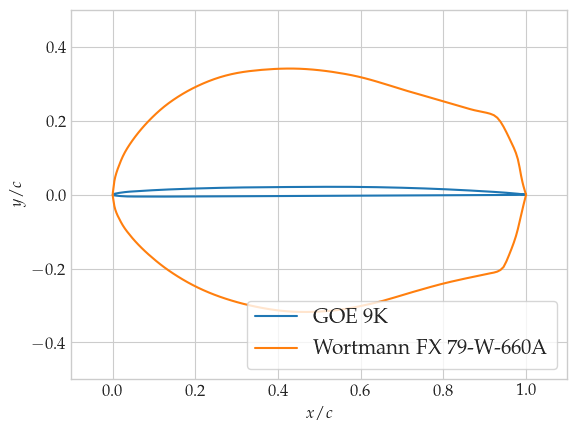

In [14]:
thicknesses = []
for i in range(1, 100):
    thickness = airfoil_df[f'yU_{i}'] - airfoil_df[f'yL_{i}']
    thicknesses.append(thickness.to_numpy())
thicknesses = np.array(thicknesses).transpose()
thicknesses = np.max(thicknesses, axis=1)
mean_thickness = np.mean(thicknesses, axis=0)
min_thickness = np.min(thicknesses, axis=0)
max_thickness = np.max(thicknesses, axis=0)
print(len(thicknesses))
print(f'mean thickness: {mean_thickness}, std: {np.std(thicknesses, axis=0)}')
print(f'min thickness: {min_thickness}, idx: {np.argmin(thicknesses, axis=0)}')
print(f'max thickness: {max_thickness}, idx: {np.argmax(thicknesses, axis=0)}')

idx = 474
plot1 = plt.subplot2grid((1,3), (0,0), colspan = 3)
af_data = pd.DataFrame(airfoil_df.iloc[idx, :].to_numpy().reshape(1, -1), columns=airfoil_df.columns)
airfoil_plot(af_data, fig=plot1, label=f'GOE 9K', n_points=num_coords, spacing='cosine')

idx = 436
af_data = pd.DataFrame(airfoil_df.iloc[idx, :].to_numpy().reshape(1, -1), columns=airfoil_df.columns)
airfoil_plot(af_data, fig=plot1, label=f'Wortmann FX 79-W-660A', n_points=num_coords, spacing='cosine')

plot1.set_xlim([-0.1,1.1])
plot1.set_ylim([-0.5,0.5])
plot1.set_title('')
save_root = './figs/paper/'
plt.savefig(f'{save_root}minvsmaxthick.pdf', format='pdf')

plt.show()

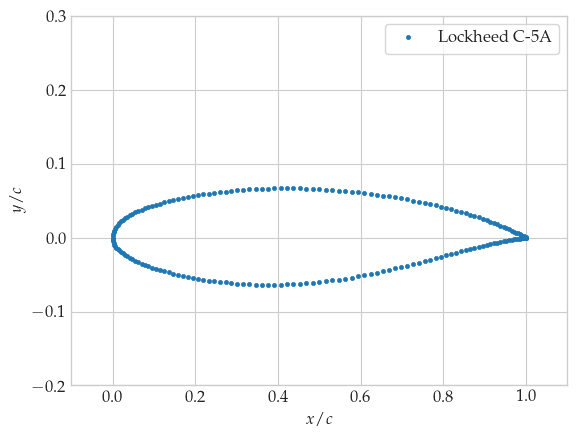

In [64]:
idx = 105
plot1 = plt.subplot2grid((1,3), (0,0), colspan = 3)
af_data = pd.DataFrame(airfoil_df.iloc[idx, :].to_numpy().reshape(1, -1), columns=airfoil_df.columns)
airfoil_plot(af_data, fig=plot1, label=f'Lockheed C-5A', n_points=num_coords, spacing='cosine')
plot1.set_title('')

save_root = './figs/paper/'
plt.savefig(f'{save_root}sampleairfoil.pdf', format='pdf')

## 2. Variational Autoencoder model
In this section, an MLP based variational encoder-decoder network will be created and trained to process airfoil coordinates and recreate them from a set of latent variables characterized by their mean $\mu$ and standard deviation $\sigma$.

**Inputs**
- Upper surface coordinates
- Lower surface coordinates

**Outputs**
- Approximately the same coordinates (network will be trained to do so)

There will be a layer in the middle that will encode the _latent feature_ distributions of the set. This is akin to a parameterization method, with arbitrary parameters.

In [15]:
# Data scaler fitting
scaler = MinMaxScaler()
scaler.fit(airfoil_df)

# Assemble a DataFrame with all the minimum and maximum values of each column
# For normalization and de-normalization. Gives an idea of the bounds.
scaler_bounds = pd.DataFrame(data = np.stack([scaler.feature_names_in_, scaler.data_min_, scaler.data_max_], axis=1), columns=['property', 'min', 'max'])

# Data normalization
airfoil_df_norm = normalize_data(airfoil_df, scaler)

# Input and "output" features
# Input and output features are both the same for this dataset.
try:
    X = airfoil_df_norm.drop(['Cl', 'Cd', 'Cm', 'ReynoldsNumber', 'MachNumber', 'alpha'], axis=1).values
except: 
    X = airfoil_df_norm.values

# Data tensors
training_data, test_data = torch_test_split(X, X, test_size=0.2)

# Data loaders
batch_size = 32

train_dataloader = DataLoader(training_data, batch_size=batch_size)
test_dataloader = DataLoader(test_data, batch_size=batch_size)

for X, y in test_dataloader:
    print(f"Shape of X [N, C, H, W]: {X.shape} {y.dtype}")
    print(f"Shape of y: {y.shape} {y.dtype}")
    break

Shape of X [N, C, H, W]: torch.Size([32, 198]) torch.float32
Shape of y: torch.Size([32, 198]) torch.float32


c:\Users\Roman\anaconda3\envs\pytorchML\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


### 2.1 Creating models

In [9]:
# Define model - AirfoilVAE
device = 'cuda'
latent_dims = 4
in_channels = num_coords

hidden_dims = [466, 167, 234]

model = AirfoilVAE(in_channels = in_channels,
                   latent_dim = latent_dims,
                   hidden_dims = hidden_dims).to(device)
print(model)

AirfoilVAE(
  (encoder): Sequential(
    (0): Linear(in_features=198, out_features=466, bias=True)
    (1): ELU(alpha=1.0)
    (2): Sequential(
      (0): Linear(in_features=466, out_features=167, bias=True)
      (1): ELU(alpha=1.0)
    )
    (3): Sequential(
      (0): Linear(in_features=167, out_features=234, bias=True)
      (1): ELU(alpha=1.0)
    )
  )
  (fc_mu): Linear(in_features=234, out_features=4, bias=True)
  (fc_var): Linear(in_features=234, out_features=4, bias=True)
  (decoder_input): Linear(in_features=4, out_features=234, bias=True)
  (decoder): Sequential(
    (0): Sequential(
      (0): Linear(in_features=234, out_features=167, bias=True)
      (1): ELU(alpha=1.0)
    )
    (1): Sequential(
      (0): Linear(in_features=167, out_features=466, bias=True)
      (1): ELU(alpha=1.0)
    )
    (2): Linear(in_features=466, out_features=198, bias=True)
  )
)


In [10]:
# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.0005, betas=(0.9, 0.999), eps=1e-08, weight_decay=0)

In [11]:
def train(dataloader, model, loss_fn, optimizer, loss_output = None, recon_output = None, kld_output = None, mse_output = None, weight = 1):
    size = len(dataloader.dataset)
    model.train()
    batchnum = len(dataloader)
    for batch, (X, y) in enumerate(dataloader):
        X, y = X.to(device), y.to(device)

        # Compute prediction error
        pred = model(X)
        loss = loss_fn(pred, weight = weight)

        # Backpropagation
        optimizer.zero_grad()
        loss['loss'].backward()
        optimizer.step()

        if batch % 10 == 0:
            losspr, current = loss['loss'].item(), batch * len(X)
            print(f"loss: {losspr:>7f}  [{current:>5d}/{size:>5d}]")
        elif batch == batchnum-1:
            losspr = loss['loss'].item()
            print(f"loss: {losspr:>7f}  [{size:>5d}/{size:>5d}]")
            
    if loss_output is not None:
        try:
            loss_output.append(loss['loss'].item())
            recon_output.append(loss['recon_loss'].item())
            kld_output.append(loss['kl_loss'].item())
            mse_output.append(loss['mse_loss'].item())
        except:
            pass
            
def test(dataloader, model, loss_fn, weight):
    num_batches = len(dataloader)
    model.eval()
    test_loss = 0
    with torch.no_grad():
        for batch, (X, y) in enumerate(dataloader):
            X, y = X.to(device), y.to(device)
            pred = model.forward(X)
            test_loss += loss_fn(pred, weight = weight)['loss'].item()
    test_loss /= num_batches
    print(f"Avg loss: {test_loss:>8f} \n")

### 2.2 Training the models

Epoch 1
-------------------------------
loss: 0.314881  [    0/ 1141]
loss: 0.012368  [  320/ 1141]
loss: 0.009131  [  640/ 1141]
loss: 0.009347  [  960/ 1141]
loss: 0.005465  [ 1141/ 1141]
Avg loss: 0.006882 

Epoch 2
-------------------------------
loss: 0.005432  [    0/ 1141]
loss: 0.005557  [  320/ 1141]
loss: 0.005144  [  640/ 1141]
loss: 0.007675  [  960/ 1141]
loss: 0.003979  [ 1141/ 1141]
Avg loss: 0.006180 

Epoch 3
-------------------------------
loss: 0.004721  [    0/ 1141]
loss: 0.004958  [  320/ 1141]
loss: 0.004874  [  640/ 1141]
loss: 0.007292  [  960/ 1141]
loss: 0.003583  [ 1141/ 1141]
Avg loss: 0.005570 

Epoch 4
-------------------------------
loss: 0.004202  [    0/ 1141]
loss: 0.004225  [  320/ 1141]
loss: 0.003227  [  640/ 1141]
loss: 0.003528  [  960/ 1141]
loss: 0.002403  [ 1141/ 1141]
Avg loss: 0.002990 

Epoch 5
-------------------------------
loss: 0.002788  [    0/ 1141]
loss: 0.002276  [  320/ 1141]
loss: 0.002840  [  640/ 1141]
loss: 0.003096  [  960/ 11

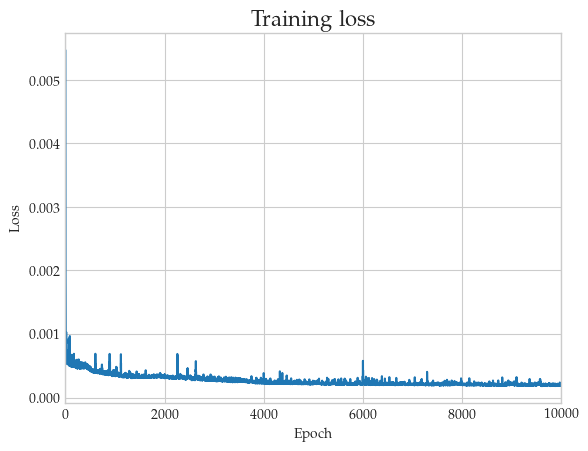

In [9]:
# Run training
epochs = 10000
loss_plot = []
recon_plot = []
kld_plot = []
mse_plot = []
for t in range(epochs):
    kld_weight_coef = 5e-6
    kld_weight = kld_weight_coef*(t/20 if t/20 <= 1 else 1)
    print(f"Epoch {t+1}\n-------------------------------")
    train(train_dataloader, model, model.loss_function, optimizer, loss_output = loss_plot, recon_output = recon_plot, kld_output = kld_plot, mse_output = mse_plot, weight = kld_weight)
    test(test_dataloader, model, model.loss_function, weight = kld_weight)
print("Done!")

# Loss plot
plt.plot(range(1, epochs+1), loss_plot)
plt.ylabel('Loss')
plt.xlabel('Epoch') 
plt.title('Training loss', fontsize=16)
plt.xlim([0,epochs])
plt.show()

In [22]:
# --- Training loop: latent dims ---
trained_root = './archive/trained_models/'
device = 'cuda'
latent_dims = [4, 64]
in_channels = num_coords
epochs = 10000
hidden_dims = [466, 167, 234]

for latent_dim in latent_dims:
    
    hidden_dims = [466, 167, 234]
    model = AirfoilVAE(in_channels = in_channels,
                   latent_dim = latent_dim,
                   hidden_dims = hidden_dims).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.0005, betas=(0.9, 0.999), eps=1e-08, weight_decay=0)
    model.apply(init_weights)
    print(f'Model {model.name} initialized.')

    loss_plot = []
    recon_plot = []
    kld_plot = []
    mse_plot = []    
    for t in range(epochs):
        kld_weight_coef = 5e-6
        kld_weight = kld_weight_coef*(t/20 if t/20 <= 1 else 1)
        print(f"Epoch {t+1}\n-------------------------------")
        train(train_dataloader, model, model.loss_function, optimizer, loss_output = loss_plot, recon_output = recon_plot, kld_output = kld_plot, mse_output = mse_plot, weight = kld_weight)
        test(test_dataloader, model, model.loss_function, weight = kld_weight)
    print("Done!")
        
    model_name = f'{model.name}_{epochs}ep_k{kld_weight_coef}_b{batch_size}.pth'
    model_path = trained_root + model_name
    torch.save(model.state_dict(), model_path)
    print(f"Saved PyTorch Model State to {model_path}")

Model VAE_MLP466_198_4 initialized.
Epoch 1
-------------------------------
loss: 0.708754  [    0/ 1141]
loss: 0.032104  [  320/ 1141]
loss: 0.014204  [  640/ 1141]
loss: 0.009546  [  960/ 1141]
loss: 0.006320  [ 1141/ 1141]
Avg loss: 0.006749 

Epoch 2
-------------------------------
loss: 0.005607  [    0/ 1141]
loss: 0.005604  [  320/ 1141]
loss: 0.004153  [  640/ 1141]
loss: 0.004891  [  960/ 1141]
loss: 0.002774  [ 1141/ 1141]
Avg loss: 0.003295 

Epoch 3
-------------------------------
loss: 0.002578  [    0/ 1141]
loss: 0.002102  [  320/ 1141]
loss: 0.001876  [  640/ 1141]
loss: 0.002008  [  960/ 1141]
loss: 0.001351  [ 1141/ 1141]
Avg loss: 0.002470 

Epoch 4
-------------------------------
loss: 0.002266  [    0/ 1141]
loss: 0.001426  [  320/ 1141]
loss: 0.001580  [  640/ 1141]
loss: 0.001804  [  960/ 1141]
loss: 0.001726  [ 1141/ 1141]
Avg loss: 0.001626 

Epoch 5
-------------------------------
loss: 0.001429  [    0/ 1141]
loss: 0.001239  [  320/ 1141]
loss: 0.001519  [  6

VAE_MLP466_198_2
VAE_MLP466_198_4
VAE_MLP466_198_6
VAE_MLP466_198_8
VAE_MLP466_198_16
VAE_MLP466_198_32
VAE_MLP466_198_64


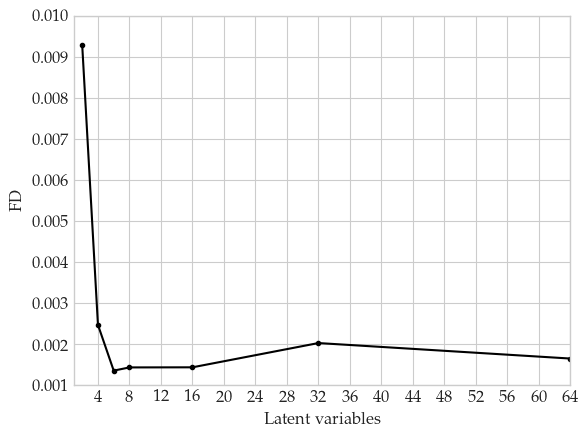

In [15]:
# latent_variables vs FID
trained_root = './archive/trained_models/'
device = 'cuda'
latent_dims = [2, 4, 6, 8, 16, 32, 64]
batch_size = 32
in_channels = num_coords
epochs = 10000
hidden_dims = [466, 167, 234]

plot_results_fid = []
for latent_dim in latent_dims:
    hidden_dims = [466, 167, 234]
    # Load model
    kld_weight_coef = 5e-6
    model = AirfoilVAE(in_channels = in_channels,
                latent_dim = latent_dim,
                hidden_dims = hidden_dims).to('cpu')
    print(model.name)
    model_root = "./archive/trained_models/"
    model_name = f'{model.name}_{epochs}ep_k{kld_weight_coef}_b{batch_size}.pth'
    model_path = model_root + model_name
    model.load_state_dict(torch.load(model_path, map_location='cpu'))
    
    sampled_norm = model.sample(10000, 'cpu', std_coef = 1)
    sampled = denormalize_data(sampled_norm.detach().cpu().numpy(),scaler)
    fid = compute_fid(airfoil_df.to_numpy(), sampled)
    
    plot_results_fid.append(fid)
    
save_root = './figs/paper/'    
plot_results_fid = [0.009284909576087057, 0.0024745930322692215, 0.001361146055022758, 0.0014391963131535751, 0.0014418400264112577, 0.0020325749960910934, 0.0016552246451421555]
plt.plot(latent_dims, plot_results_fid, 'k-', marker='.')
plt.xlabel(r'Latent variables')
plt.ylabel(r'FD')
plt.grid(which='minor', axis='both', linestyle='--')
plt.xlim([1, 64])
plt.ylim([0.001, 0.01])
#plt.xticks([2, 4, 8, 16, 32, 64])
plt.xticks([4, 8, 12, 16, 20, 24, 28, 32, 36, 40, 44, 48, 52, 56, 60, 64])
plt.savefig(f'{save_root}FIDvslatent.pdf', format='pdf')
plt.show()


In [16]:
save_root = './figs/paper/'   

In [27]:
# --- k comparison loop ---
loss_dict = {}
trained_root = './archive/trained_models/'
device = 'cuda'
latent_dim = 3
in_channels = num_coords
epochs = 5000

try:
    file_name = "./archive/trained_models/arch_k_comparison.pkl"
    loss_dict = pd.read_pickle(file_name)
except:
    loss_dict = {}

#for hiddim in [512, 256, 128, 64]:
for hiddim in [256]:
    hidden_dims = [hiddim, int(hiddim/2), int(hiddim/4)]
    model = AirfoilVAE(in_channels = in_channels,
                   latent_dim = latent_dim,
                   hidden_dims = hidden_dims).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.0005, betas=(0.9, 0.999), eps=1e-08, weight_decay=0)

    # for k_val in [1, 0.1, 0.01, 0.005, 0.001, 0.00075, 0.0005, 0.0004, 0.0003, 0.0002, 0.0001, 0.00005, 0.00001, 0.000005, 0.0000025, 0.000001, 0.0000005, 0.0000001]:
    for k_val in [0.0000001]:
        model.apply(init_weights)
        print(f'Model {model.name} initialized.')
        loss_plot = []
        recon_plot = []
        kld_plot = []
        mse_plot = []
        
        for t in range(epochs):
            kld_weight_coef = k_val
            kld_weight = kld_weight_coef*(t/20 if t/20 <= 1 else 1)
            print(f"Epoch {t+1}\n-------------------------------")
            train(train_dataloader, model, model.loss_function, optimizer, loss_output = loss_plot, recon_output = recon_plot, kld_output = kld_plot, mse_output = mse_plot, weight = kld_weight)
            test(test_dataloader, model, model.loss_function, weight = kld_weight)
        print("Done!")
        
        loss_dict[f'{hiddim}_{kld_weight_coef}'] = {'loss': loss_plot, 'recon': recon_plot, 'kld': kld_plot}
        model_name = f'{model.name}_{epochs}ep_k{kld_weight_coef}_b{batch_size}.pth'
        model_path = trained_root + model_name
        torch.save(model.state_dict(), model_path)
        print(f"Saved PyTorch Model State to {model_path}")

results_file = open('./archive/trained_models/arch_k_comparison.pkl', 'wb')
pickle.dump(loss_dict, results_file)
results_file.close()

Model VAE_MLP256_198_3 initialized.
Epoch 1
-------------------------------
loss: 0.669900  [    0/ 1141]
loss: 0.172842  [  320/ 1141]
loss: 0.017538  [  640/ 1141]
loss: 0.015317  [  960/ 1141]
loss: 0.008603  [ 1141/ 1141]
Avg loss: 0.008945 

Epoch 2
-------------------------------
loss: 0.008026  [    0/ 1141]
loss: 0.006115  [  320/ 1141]
loss: 0.004839  [  640/ 1141]
loss: 0.006074  [  960/ 1141]
loss: 0.003428  [ 1141/ 1141]
Avg loss: 0.005366 

Epoch 3
-------------------------------
loss: 0.004110  [    0/ 1141]
loss: 0.004343  [  320/ 1141]
loss: 0.003436  [  640/ 1141]
loss: 0.003996  [  960/ 1141]
loss: 0.002254  [ 1141/ 1141]
Avg loss: 0.002960 

Epoch 4
-------------------------------
loss: 0.002316  [    0/ 1141]
loss: 0.002207  [  320/ 1141]
loss: 0.002045  [  640/ 1141]
loss: 0.002168  [  960/ 1141]
loss: 0.001366  [ 1141/ 1141]
Avg loss: 0.001871 

Epoch 5
-------------------------------
loss: 0.001600  [    0/ 1141]
loss: 0.001349  [  320/ 1141]
loss: 0.001554  [  6

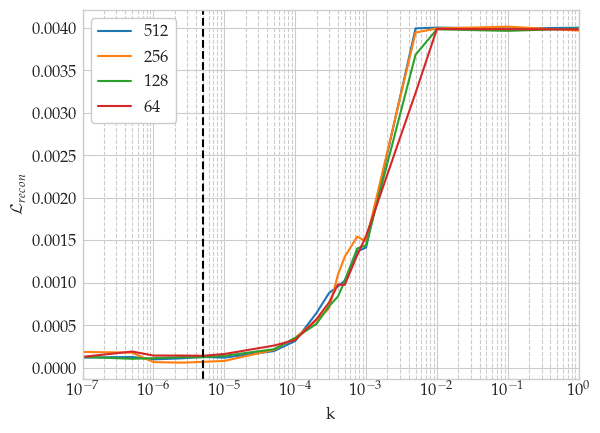

In [10]:
# Plot the loss
file_name = "./archive/trained_models/arch_k_comparison.pkl"
results_k_arch = pd.read_pickle(file_name)

neurons = [512, 256, 128, 64]
k = [1, 0.1, 0.01, 0.005, 0.001, 0.00075, 0.0005, 0.0004, 0.0003, 0.0002, 0.0001, 0.00005, 0.00001, 0.000005, 0.0000025, 0.000001, 0.0000005, 0.0000001]

plot_results = {}
for n in neurons:
    plot_results[n] = []
    for k_val in k:
        plot_results[n].append(results_k_arch[f'{n}_{k_val}']['recon'][-1])
    plt.semilogx(k, plot_results[n], label = f'{n}')

plt.legend(frameon=True, framealpha=1)
plt.xlabel(r'k')
plt.ylabel(r'$\mathcal{L}_{recon}$')
plt.grid(which='minor', axis='both', linestyle='--')
plt.xlim([min(k),max(k)])
plt.axvline(x=0.000005, color='k', linestyle='--')
plt.savefig(f'{save_root}reconvsk.pdf', format='pdf')
plt.show()

In [11]:
# Compute and plot FID
epochs = 5000
batch_size = 32
latent_dim = 4
in_channels = 198
file_name = "./archive/trained_models/arch_k_comparison.pkl"
results_k_arch = pd.read_pickle(file_name)

neurons = [512, 256, 128, 64]
k = [1, 0.1, 0.01, 0.005, 0.001, 0.00075, 0.0005, 0.0004, 0.0003, 0.0002, 0.0001, 0.00005, 0.00001, 0.000005, 0.0000025, 0.000001, 0.0000005, 0.0000001]

plot_results_fid = {}
for n in neurons:
    plot_results_fid[n] = []
    for k_val in k:
        # Load model
        kld_weight_coef = k_val
        hidden_dims = [n, int(n/2), int(n/4)]
        model = AirfoilVAE(in_channels = in_channels,
                    latent_dim = latent_dim,
                    hidden_dims = hidden_dims).to('cpu')
        model_root = "./archive/trained_models/"
        model_name = f'{model.name}_{epochs}ep_k{kld_weight_coef}_b{batch_size}.pth'
        model_path = model_root + model_name
        model.load_state_dict(torch.load(model_path, map_location='cpu'))
        
        sampled_norm = model.sample(10000, 'cpu', std_coef = 1)
        sampled = denormalize_data(sampled_norm.detach().cpu().numpy(),scaler)
        fid = compute_fid(airfoil_df.to_numpy(), sampled)
        
        plot_results_fid[n].append(fid)
    plt.semilogx(k, plot_results_fid[n], label = f'{n}')

plt.xlabel(r'k')
plt.ylabel(r'FD')
plt.grid(which='minor', axis='both', linestyle='--')
plt.xlim([min(k),max(k)])
plt.legend(frameon=True, framealpha=1)
plt.axvline(x=0.000005, color='k', linestyle='--')
plt.savefig(f'{save_root}FIDvsk.pdf', format='pdf')
plt.show()

NameError: name 'scaler' is not defined

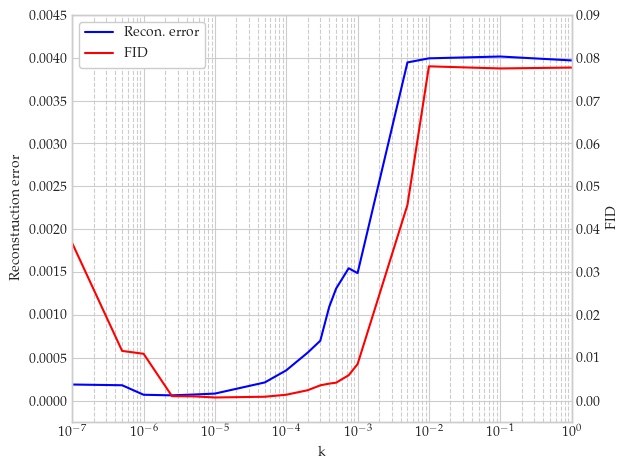

In [70]:
# Combined plot
from compute_fid import compute_fid
epochs = 5000
batch_size = 32
latent_dim = 5
in_channels = 198
file_name = "./archive/trained_models/arch_k_comparison.pkl"
results_k_arch = pd.read_pickle(file_name)

neurons = [256]
k = [1, 0.1, 0.01, 0.005, 0.001, 0.00075, 0.0005, 0.0004, 0.0003, 0.0002, 0.0001, 0.00005, 0.00001, 0.000005, 0.0000025, 0.000001, 0.0000005, 0.0000001]

fig = plt.figure()
ax1 = fig.add_subplot()

# Plot reconstruction error
plot_results = {}
for n in neurons:
    plot_results[n] = []
    for k_val in k:
        plot_results[n].append(results_k_arch[f'{n}_{k_val}']['recon'][-1])
    l1, = ax1.semilogx(k, plot_results[n], label = 'Recon. error', color = 'blue')

# Plot FID
ax2 = ax1.twinx()
plot_results_fid = {}
for n in neurons:
    plot_results_fid[n] = []
    for k_val in k:
        # Load model
        kld_weight_coef = k_val
        hidden_dims = [n, int(n/2), int(n/4)]
        model = AirfoilVAE(in_channels = in_channels,
                    latent_dim = latent_dim,
                    hidden_dims = hidden_dims).to('cpu')
        model_root = "./archive/trained_models/"
        model_name = f'{model.name}_{epochs}ep_k{kld_weight_coef}_b{batch_size}.pth'
        model_path = model_root + model_name
        model.load_state_dict(torch.load(model_path, map_location='cpu'))
        
        sampled_norm = model.sample(10000, 'cpu', std_coef = 1)
        sampled = denormalize_data(sampled_norm.detach().cpu().numpy(),scaler)
        fid = compute_fid(airfoil_df.to_numpy(), sampled)
        
        plot_results_fid[n].append(fid)
    l2, = ax2.semilogx(k, plot_results_fid[n], label = 'FID', color = 'red')

from matplotlib import rcParams
rcParams.update({'figure.autolayout': True})

plt.legend([l1, l2], ['Recon. error', 'FID'], frameon=True, framealpha=1)
ax1.set_xlabel(r'k')
ax1.set_ylabel(r'Reconstruction error')
ax2.set_ylabel(r'FID')
#ax2.set_yticks(np.linspace(ax2.get_yticks()[0], ax2.get_yticks()[-1], len(ax1.get_yticks())))
ax1.grid(which='minor', axis='both', linestyle='--')
ax2.grid(None)

# ---
ax1.set_ylim(-0.00025, 0.0045)
ax1.set_yticks(np.linspace(0, 0.0045, 10))

ax2.set_ylim(-0.005, 0.09)
ax2.set_yticks(np.linspace(0, 0.09, 10))
# ---

plt.xlim([min(k),max(k)])
plt.savefig(f'{save_root}FIDreconvsk_{neurons[0]}.pdf', format='pdf')
plt.show()

NameError: name 'scaler' is not defined

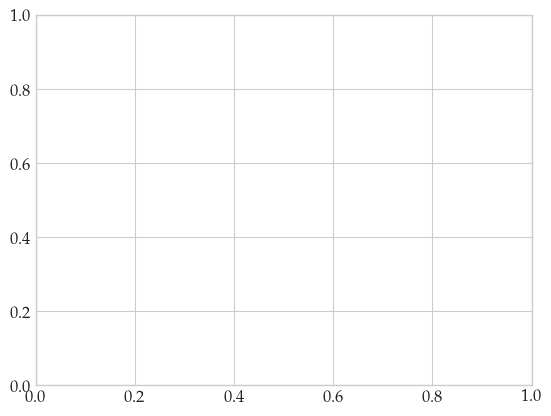

In [12]:
# Comparison plot
from compute_fid import compute_fid
epochs = 5000
batch_size = 32
latent_dims = [3, 4, 5]
in_channels = 198
file_name = "./archive/trained_models/arch_k_comparison.pkl"
results_k_arch = pd.read_pickle(file_name)

neurons = [256]
k = [1, 0.1, 0.01, 0.005, 0.001, 0.00075, 0.0005, 0.0004, 0.0003, 0.0002, 0.0001, 0.00005, 0.00001, 0.000005, 0.0000025, 0.000001, 0.0000005, 0.0000001]

fig = plt.figure()
ax1 = fig.add_subplot()

colors = ['tab:blue', 'tab:orange', 'tab:green']
idx = 0
# Plot FID
plot_results_fid = {}
for n in neurons:
    for latent_dim in latent_dims:
        plot_results_fid[n] = []    
        for k_val in k:
            # Load model
            kld_weight_coef = k_val
            hidden_dims = [n, int(n/2), int(n/4)]
            model = AirfoilVAE(in_channels = in_channels,
                        latent_dim = latent_dim,
                        hidden_dims = hidden_dims).to('cpu')
            model_root = "./archive/trained_models/"
            model_name = f'{model.name}_{epochs}ep_k{kld_weight_coef}_b{batch_size}.pth'
            model_path = model_root + model_name
            model.load_state_dict(torch.load(model_path, map_location='cpu'))
            
            sampled_norm = model.sample(10000, 'cpu', std_coef = 1)
            sampled = denormalize_data(sampled_norm.detach().cpu().numpy(),scaler)
            fid = compute_fid(airfoil_df.to_numpy(), sampled)
            
            plot_results_fid[n].append(fid)
        ax1.semilogx(k, plot_results_fid[n], label = f'n = {latent_dim}', color = colors[idx])
        idx += 1

from matplotlib import rcParams
rcParams.update({'figure.autolayout': True})

plt.legend(frameon=True, framealpha=1)
ax1.set_xlabel(r'k')
ax1.set_ylabel(r'FD')
ax1.grid(which='minor', axis='both', linestyle='--')

# ---
#ax1.set_ylim(0.000, 0.009)
#ax1.set_yticks(np.linspace(0, 0.009, 10))
# ---

plt.xlim([min(k),max(k)])
plt.savefig(f'{save_root}FIDvsn_{neurons[0]}.pdf', format='pdf')
plt.show()

### 2.3 Saving the model

In [10]:
save_model = False
model_name = f'{model.name}_{epochs}ep_k{kld_weight_coef}_b{batch_size}.pth'

if save_model:
    trained_root = "./archive/trained_models/"
    
    model_path = trained_root + model_name
    torch.save(model.state_dict(), model_path)
    print(f"Saved PyTorch Model State to {model_path}")

Saved PyTorch Model State to ./archive/trained_models/VAE_MLP466_198_3_10000ep_k5e-06_b32.pth


### 2.4 Loading the model

In [17]:
# For these sections, the CPU will be used
in_channels = 198
latent_dim = 4
hidden_dims = [466, 167, 234]
kld_weight_coef = 0.000005
batch_size = 32
epochs = 10000

device = 'cpu'
model = AirfoilVAE(in_channels = in_channels,
            latent_dim = latent_dim,
            hidden_dims = hidden_dims).to(device)

model_root = "./archive/trained_models/"
model_name = f'{model.name}_{epochs}ep_k{kld_weight_coef}_b{batch_size}.pth'

model_path = model_root + model_name
model.load_state_dict(torch.load(model_path, map_location=device))

<All keys matched successfully>

### 2.5 Making predictions on random airfoils

mu: [-0.08521464  0.23128065  1.711888    0.54263294]
std: [0.0568923  0.04278446 0.04430196 0.06266671]
mse: 0.0006849626079201698
------ Comparison ------


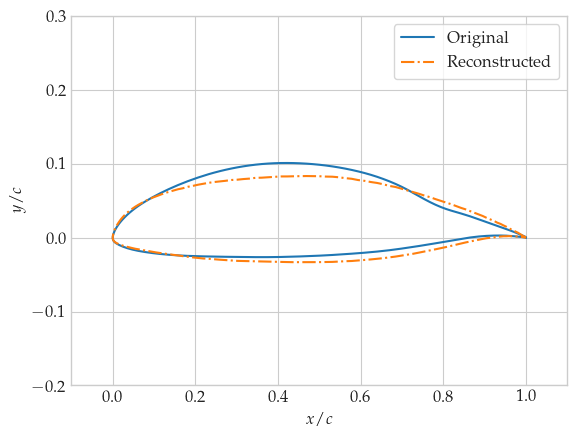

In [43]:
idxpred = np.random.randint(0, len(test_data))
x, y = test_data[idxpred][0].to(device), test_data[idxpred][1].to(device)

with torch.no_grad():
    pred = model.forward(x)     # Returns [recons, input, mu, log_var]
    reconstructed = denormalize_data(pred[0].cpu().numpy(),scaler)
    original = denormalize_data(pred[1].cpu().numpy(),scaler)
    plot1 = plt.subplot2grid((1,3), (0,0), colspan = 3)
    print(f'mu: {pred[2].cpu().numpy()}')
    print(f'std: {np.exp(0.5*pred[3].cpu().numpy())}')
    print(f'mse: {F.mse_loss(pred[0], pred[1]).item()}')
    print("------ Comparison ------")
    airfoil_plot(original, fig=plot1, linestyle='-', label="Original", n_points=num_coords, spacing='cosine')
    airfoil_plot(reconstructed, fig=plot1, linestyle='-.', color='tab:orange', label="Reconstructed", n_points=num_coords, spacing='cosine')
    save_root = './figs/paper/'
    plt.title('')
    plt.savefig(f'{save_root}vae_recon_bad.pdf', format='pdf')
    plt.show()

### 2.6 Generating random airfoils

C:\Users\Usuario\AppData\Local\Temp\ipykernel_13772\3472181825.py:8: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  plt.grid(b=None)


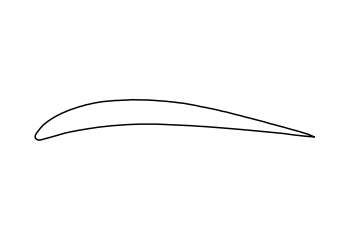

In [160]:
drawing = True # If True, generates a drawing of an airfoil (no axes, title or labels)
with torch.no_grad():
    sampled = model.sample(1, 'cpu', std_coef = 1.1)     # Returns [norm_coords] of an invented airfoil
    invented = denormalize_data(sampled[0].cpu().numpy(),scaler)
    airfoil_plot(invented, label="Generated", n_points=num_coords, spacing='cosine', linestyle='-')
    if drawing == True:
        plt.axis('off')
        plt.grid(b=None)
        plt.title("")
        plt.legend('',frameon=False)
    plt.savefig('./figs/paper/generated_airfoil.svg', format='svg', dpi=1200)
    plt.show()

C:\Users\Roman\AppData\Local\Temp\ipykernel_15556\1656331391.py:11: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  plt.grid(b=None)


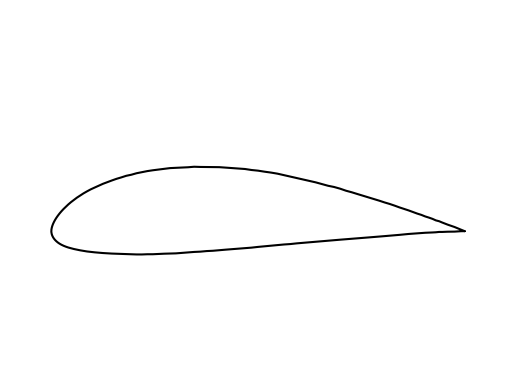

In [67]:
# Guided drawing
drawing = True # If True, generates a drawing of an airfoil (no axes, title or labels)
values = np.array([0.0, 0.0, 0.0, 0.0])
values = torch.from_numpy(values).float()
with torch.no_grad():
    sampled = model.decode(values)
    invented = denormalize_data(sampled.cpu().numpy(), scaler)
    airfoil_plot(invented, label="Generated", n_points=num_coords, color='black', spacing='cosine', linestyle='-')
    if drawing == True:
        plt.axis('off')
        plt.grid(b=None)
        plt.title("")
        plt.legend('',frameon=False)
    plt.savefig('./figs/paper/vae_0000.svg', format='svg', dpi=1200)
    plt.show()

C:\Users\Roman\AppData\Local\Temp\ipykernel_15556\1002792736.py:12: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  axs[i,j].grid(b=None)
C:\Users\Roman\AppData\Local\Temp\ipykernel_15556\1002792736.py:12: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  axs[i,j].grid(b=None)
C:\Users\Roman\AppData\Local\Temp\ipykernel_15556\1002792736.py:12: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  axs[i,j].grid(b=None)
C:\Users\Roman\AppData\Local\Temp\ipykernel_15556\1002792736.py:12: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name wi

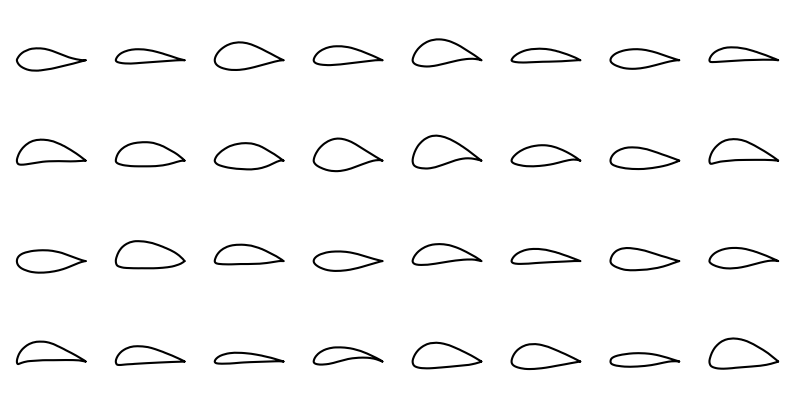

In [49]:
# Generate a grid-shaped plot with an array of random airfoils
size = [4, 8]
fig, axs = plt.subplots(size[0], size[1], figsize=(10,5))

with torch.no_grad():
    for i in range(size[0]):
            for j in range(size[1]):
                sampled = model.sample(1, 'cpu', std_coef = 1)     # Returns [norm_coords] of an invented airfoil
                invented = denormalize_data(sampled[0].cpu().numpy(),scaler)
                airfoil_plot(invented, fig=axs[i][j], linestyle='-', color='black', label='generated')
                axs[i,j].axis('off')
                axs[i,j].grid(b=None)
                axs[i,j].set_title("")
                axs[i,j].legend('',frameon=False)
plt.savefig('./figs/paper/random_sample4.svg', format='svg', dpi=1200)
plt.show()

C:\Users\Roman\AppData\Local\Temp\ipykernel_14788\2089936210.py:18: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  axs[i,j].grid(b=None)
C:\Users\Roman\AppData\Local\Temp\ipykernel_14788\2089936210.py:18: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  axs[i,j].grid(b=None)
C:\Users\Roman\AppData\Local\Temp\ipykernel_14788\2089936210.py:18: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  axs[i,j].grid(b=None)
C:\Users\Roman\AppData\Local\Temp\ipykernel_14788\2089936210.py:18: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name wi

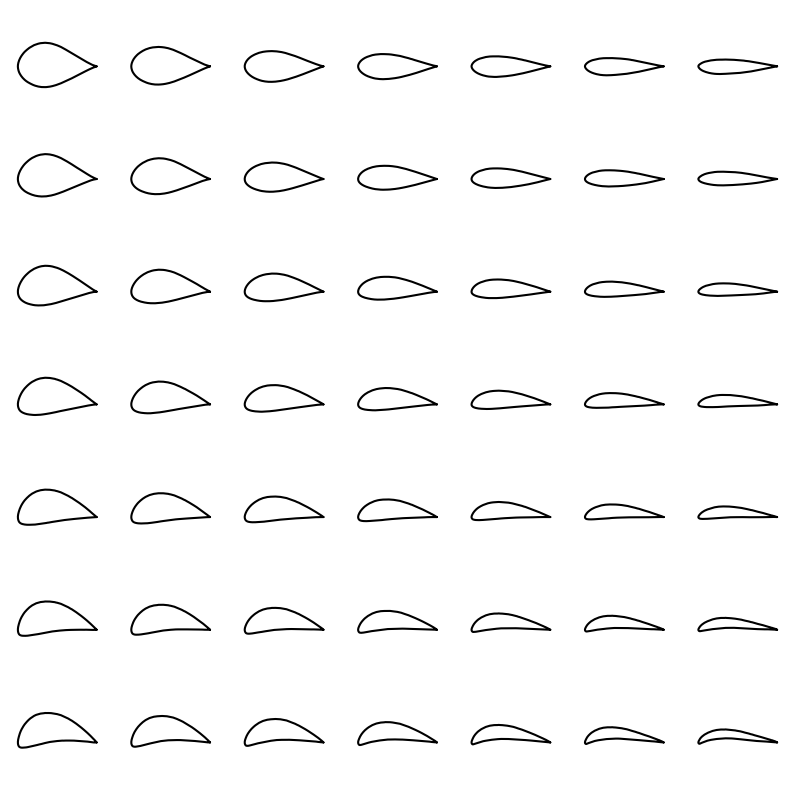

In [40]:
# 1 and 2 latent variable change visualization
size = [7, 7]
fig, axs = plt.subplots(size[0], size[1], figsize=(10,10))
latentrange_1 = np.linspace(2.0, -2.0, size[0])     # Camber change (y-axis)
latentrange_2 = np.linspace(-2.0, 2.0, size[1])     # Thickness change (x-axis)
with torch.no_grad():

    for i in range(size[0]):
        for j in range(size[1]):
            array_input = np.zeros((1, latent_dim)).reshape(latent_dim)
            array_input[0] = latentrange_1[i]
            array_input[1] = latentrange_2[j]
            tensor_input = torch.Tensor(array_input.reshape(1, latent_dim))
            sampled = model.decode(tensor_input)     # Returns [norm_coords] of an invented airfoil
            invented = denormalize_data(sampled[0].cpu().numpy(),scaler)
            airfoil_plot(invented, fig=axs[i,j], linestyle='-', color='black', label='generated')
            axs[i,j].axis('off')
            axs[i,j].grid(b=None)
            axs[i,j].set_title("")
            axs[i,j].legend('',frameon=False)
plt.savefig('./figs/paper/latent_thickness1x_camber0y.eps', format='eps', dpi=1200)
plt.show()

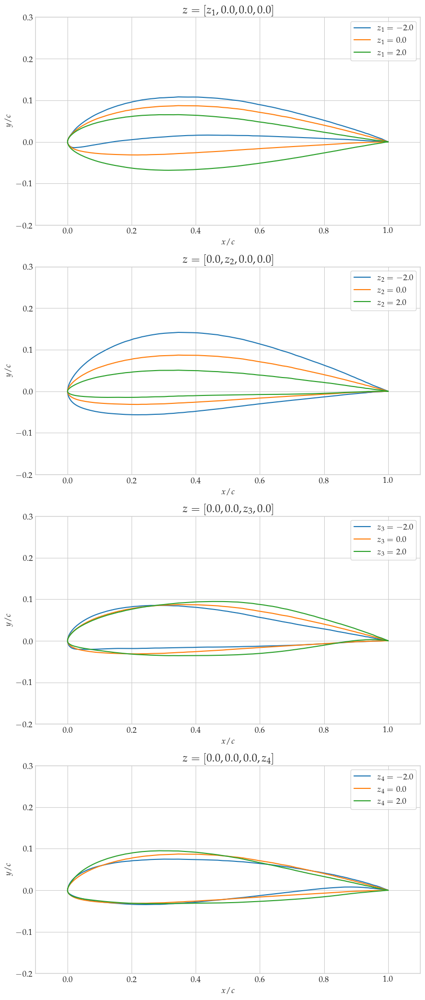

In [11]:
# --- LATENT VARIABLE CHANGE ANALYSIS ---
fig, axs = plt.subplots(latent_dim, 1, figsize=(10,25))
titles = [r"$z=[z_1, 0.0, 0.0, 0.0]$",
          r"$z=[0.0, z_2, 0.0, 0.0]$",
          r"$z=[0.0, 0.0, z_3, 0.0]$",
          r"$z=[0.0, 0.0, 0.0, z_4]$"]
with torch.no_grad():
    for idx in range(latent_dim):
        count = 0
        for value in np.linspace(-2,2,3):
            array_input = np.zeros((1, latent_dim)).reshape(latent_dim)
            array_input[idx] = value
            tensor_input = torch.Tensor(array_input.reshape(1, latent_dim))
            sampled = model.decode(tensor_input)     # Returns [norm_coords] of an invented airfoil
            invented = denormalize_data(sampled[0].cpu().numpy(),scaler)
            airfoil_plot(invented, fig=axs[idx], label=f'$z_{idx+1}={np.round(value,1)}$', title=titles[idx], n_points=num_coords, spacing='cosine')
            count+=1
#plt.savefig('./figs/paper/latent_thickness1x_camber0y.svg', format='svg', dpi=1200)
plt.show()

       yU_1      yU_2      yU_3      yU_4      yU_5      yU_6      yU_7  \
0  0.000053  0.000194  0.000554  0.000933  0.001405  0.002007  0.002752   

       yU_8      yU_9     yU_10  ...     yL_90     yL_91     yL_92     yL_93  \
0  0.003679  0.004724  0.005611  ... -0.000625 -0.000438 -0.000275 -0.000102   

      yL_94     yL_95     yL_96     yL_97    yL_98     yL_99  
0 -0.000049 -0.000047 -0.000053 -0.000059 -0.00003  0.000005  

[1 rows x 198 columns]


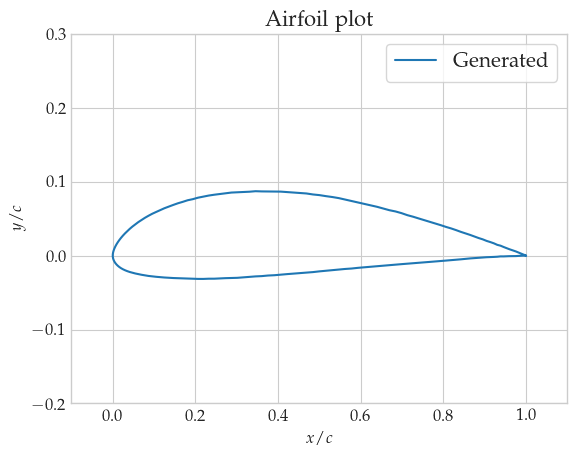

In [18]:
# Generate airfoils from latent variables
with torch.no_grad():
    array_input = np.array([0.0,0.0,0.0,0.0])
    tensor_input = torch.Tensor(array_input.reshape(1, latent_dim))
    sampled = model.decode(tensor_input)     # Returns [norm_coords] of an invented airfoil
    generated = denormalize_data(sampled[0].cpu().numpy(),scaler)
    x, y = airfoil_plot(generated, label="Generated", n_points=num_coords, spacing='cosine')
    plt.show()

Reading airfoil coordinates from: model/sanity_check/shape_optim.dat
mu: [ 2.008378   0.6492267  1.3769189 -1.160747 ]
std: [0.0520694  0.03570519 0.07996251 0.08262276]
mse: 0.00016287926700897515
------ Comparison ------


c:\Users\Usuario\.conda\envs\pytorchML\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


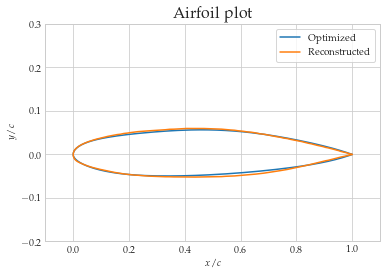

Airfoil saved successfully!


In [15]:
# Run a 201 coordinate points airfoil from a .dat file through the network

def save_airfoil(airfoil, filename, n_points = 198):
    """
    Saves an airfoil's x and y coordinates to a .dat file. Uses cosine spacing.
    Inputs:
    - airfoil: numpy array of Y airfoil coordinates
    - filename: string of the filename to save the airfoil to
    """

    # X: cosine spacing
    points_per_surf = int(n_points/2)
    x = list(reversed([0.5*(1-np.cos(ang)) for ang in np.linspace(0,np.pi,points_per_surf+2)]))
    aux_x = list([0.5*(1-np.cos(ang)) for ang in np.linspace(0,np.pi,points_per_surf+2)[1:points_per_surf+1]])
    [x.append(i) for i in aux_x]
    x.append(1.0)
    
    # Y
    y = []
    origin = (airfoil[0] + airfoil[points_per_surf])/2
    y.append(0.0)
    [y.append(j) for j in airfoil[0:points_per_surf].tolist()]
    y.append(origin)
    aux_y = list(airfoil[points_per_surf:n_points].tolist())
    [y.append(k) for k in aux_y]
    y.append(0.0)
    
    with open(filename, 'w', newline='') as datfile:
        for i in range(len(x)):
            print(f'{x[i]:.8E} {y[i]:.8E}', file=datfile)
    
    print('Airfoil saved successfully!')
    
filename = 'model/sanity_check/shape_optim.dat'
with open(filename, 'r') as f:
    print(f'Reading airfoil coordinates from: {filename}')
    airfoil = np.loadtxt(f, unpack = True)

airfoil_f = []
airfoil_f.extend(airfoil[1][1:100])
airfoil_f.extend(airfoil[1][101:200])
airfoil_f = np.array(airfoil_f).reshape(1,-1)
airfoil_f = pd.DataFrame(airfoil_f, columns = airfoil_df.columns)

x = torch.Tensor(normalize_data(airfoil_f, scaler).to_numpy()[0]).to(device)
with torch.no_grad():
    pred = model.forward(x)     # Returns [recons, input, mu, log_var]
    reconstructed = denormalize_data(pred[0].cpu().numpy(),scaler)
    original = denormalize_data(pred[1].cpu().numpy(),scaler)
    plot1 = plt.subplot2grid((1,3), (0,0), colspan = 3)
    print(f'mu: {pred[2].cpu().numpy()}')
    print(f'std: {np.exp(0.5*pred[3].cpu().numpy())}')
    print(f'mse: {F.mse_loss(pred[0], pred[1]).item()}')
    print("------ Comparison ------")
    airfoil_plot(original, fig=plot1, label="Optimized", n_points=num_coords, spacing='cosine')
    airfoil_plot(reconstructed, fig=plot1, label="Reconstructed", n_points=num_coords, spacing='cosine')
    plt.show()
    # save_airfoil(reconstructed.to_numpy()[0], 'model/sanity_check/shape_optim_recon.dat')

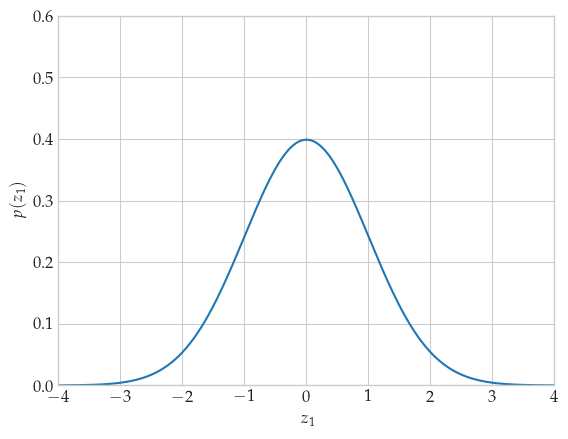

In [47]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
  
# Plot between -10 and 10 with .001 steps.
x_axis = np.arange(-4, 4, 0.01)
  
plt.plot(x_axis, norm.pdf(x_axis, 0, 1))
plt.ylabel('$p(z_1)$')
plt.xlabel('$z_1$')
plt.ylim(0, 0.6)
plt.xlim(-4, 4)
save_root = './figs/paper/'
plt.savefig(f'{save_root}standard_normal.svg', format='svg')
plt.show()